## Geometric and color transformation
In this notebook, we consider two major types of image transformations -- the geometric and the color transformation. These two transformations are well used techniques for data augmentation in the computer vision domain. Geometric transformation transforms images on the basis on their pixel locations, whereas colour transformation transforms image on the basis o the intensity of the image in terms of brightness, saturation and contrast.  We also perform certain interpolation schemes such as the nearest neighbour, bilinear, and bicubic interpolation schemes.

#### Workspace utilies

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage import transform
import math
import albumentations

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### **01. Geometric transformation**
A functional mapping between two geometric spaces (also called affine spaces) which preserves points, straight and parrallel lines as well as ratios between points is called Geometric or Affine Transformation. Pratically, this imply a linear transformation that enable analyst to manipulate images like rotatiing, flipping, scalling or shearing through a transformation matrix.

In this notebook, we consider different kinds of transformation matrices and use them to manipulate our images. The particular transformation matrices of interests are:
- identity,
- scaling, 
- rotation, 
- translation, and
- shearing (Horizontal and vertical shear)

IMPORTANT: Affine transformation uses angle of rotation that is clockwise in contrast to the typical geometric unit circle of angles measured in counter clockwise rotation with zero at the positive axis. Hence, the negative of the angle is often applied. 

In [ ]:
img = plt.imread('/content/drive/MyDrive/UBS/Computer Vision/Data/Idanre_hills.jpg')
# Create the Transformation matrix for the different transformations. 

# 3x3 identity transformation matrix
I = np.eye(3)

# create scaling transformation matrix
M_scale = transform.SimilarityTransform(scale=0.5)


#  create rotation transformation matrix
M_rotate = transform.SimilarityTransform(scale=1, rotation=math.pi/8)

#  create translation transformation matrix
M_translate = transform.SimilarityTransform(scale=1, translation=(50, 50))

Text(0.5, 1.0, 'Translation transformation')

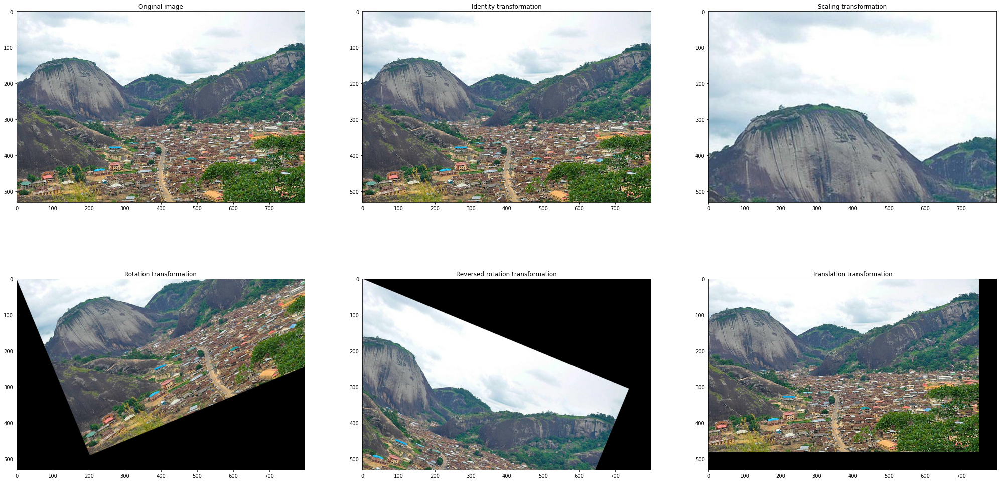

In [ ]:
# display the different geometric transformation
identity = transform.warp(img, I) # identity transformation
scaled = transform.warp(img, M_scale) # scaling transformation
rotated = transform.warp(img, M_rotate) # rotation transformation
back_rotated = transform.warp(img, M_rotate.inverse) # reverse rotation
translated = transform.warp(img, M_translate) # translation transformation



fig, axs = plt.subplots(2, 3, figsize=(35, 18))

axs[0, 0].imshow(img)
axs[0, 0].set_title("Original image")

axs[0, 1].imshow(identity)
axs[0, 1].set_title("Identity transformation")

axs[0, 2].imshow(scaled)
axs[0, 2].set_title("Scaling transformation")

axs[1, 0].imshow(rotated)
axs[1, 0].set_title("Rotation transformation")

axs[1, 1].imshow(back_rotated)
axs[1, 1].set_title("Reversed rotation transformation")

axs[1, 2].imshow(translated)
axs[1, 2].set_title("Translation transformation")

Text(0.5, 1.0, 'Vertical scaling  transformation')

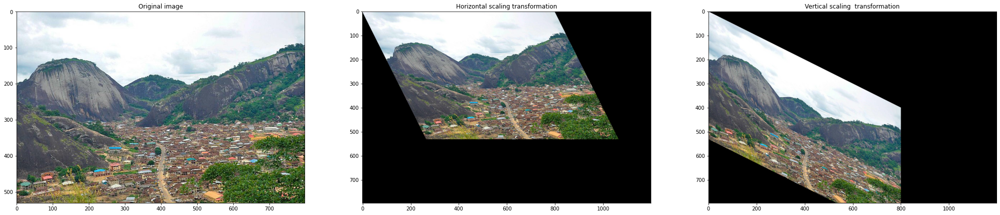

In [ ]:
# Horizontal Shearing
M_hor = np.float32([[1, 0.5, 0],
             	[0, 1  , 0],
            	[0, 0  , 1]])

# Vertical Shearing
M_ver = np.float32([[1,   0, 0],
            	  [0.5, 1, 0],
            	  [0,   0, 1]])

rows,cols = img.shape[:2]

# apply a perspective transformation to the image                
sheared_hor = cv2.warpPerspective(img,M_hor,(int(cols*1.5),int(rows*1.5)))
sheared_ver = cv2.warpPerspective(img, M_ver, (int(cols*1.5),int(rows*1.5)))

fig, axs = plt.subplots(1, 3, figsize=(35, 18))

axs[0].imshow(img)
axs[0].set_title("Original image")

axs[1].imshow(sheared_hor)
axs[1].set_title("Horizontal scaling transformation")

axs[2].imshow(sheared_ver)
axs[2].set_title("Vertical scaling  transformation")

#### **02 Interpolation**
Interpolation is used in vision tasks such as zooming, rotating, and geometrically correcting digital images. It is also used in image resizing tasks such as shrinking and zooming. 
- Nearest Neighbour,
- Bilinear, 
- Bicubic

In [97]:
down_img = cv2.pyrDown(cv2.pyrDown(img))

Text(0.5, 1.0, 'Bicubic interpolation')

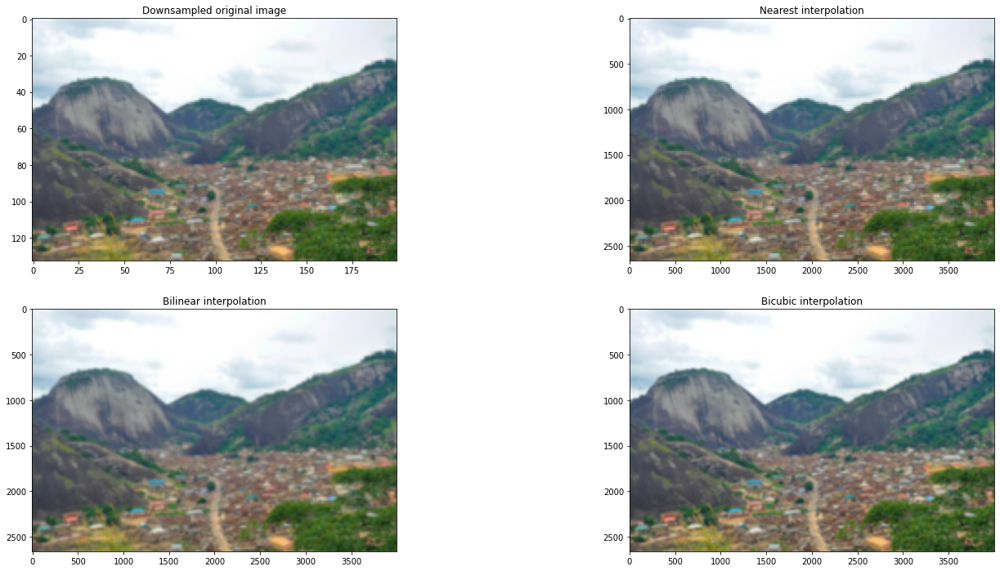

In [118]:
nearest_neigh = cv2.resize(down_img,None, fx = 20, fy = 20, interpolation = cv2.INTER_NEAREST)
bilinear_img = cv2.resize(down_img,None, fx = 20, fy = 20, interpolation = cv2.INTER_LINEAR)
bicubic_img = cv2.resize(down_img,None, fx = 20, fy = 20, interpolation = cv2.INTER_CUBIC)

fig, axs = plt.subplots(2, 2, figsize = (24, 12))

axs[0, 0].imshow(down_img)
axs[0, 0].set_title("Downsampled original image")

axs[0, 1].imshow(nearest_neigh)
axs[0, 1].set_title("Nearest interpolation")

axs[1, 0].imshow(bilinear_img)
axs[1, 0].set_title("Bilinear interpolation")

axs[1, 1].imshow(bicubic_img)
axs[1, 1].set_title("Bicubic interpolation")

#### **03 Color Transformation**
In this section of the notebook, we will transform the image into different color spaces and display it's corresponding color components. The two color spaces that are of particular interests are: 
- LAB, 
- HSV


In [ ]:
import numpy as np
from skimage.io import imread
from skimage.color import rgb2lab, lab2rgb, rgb2hsv, hsv2rgb
import matplotlib.pylab as plt

###### LAB

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Color Component: Chrominance -- b')

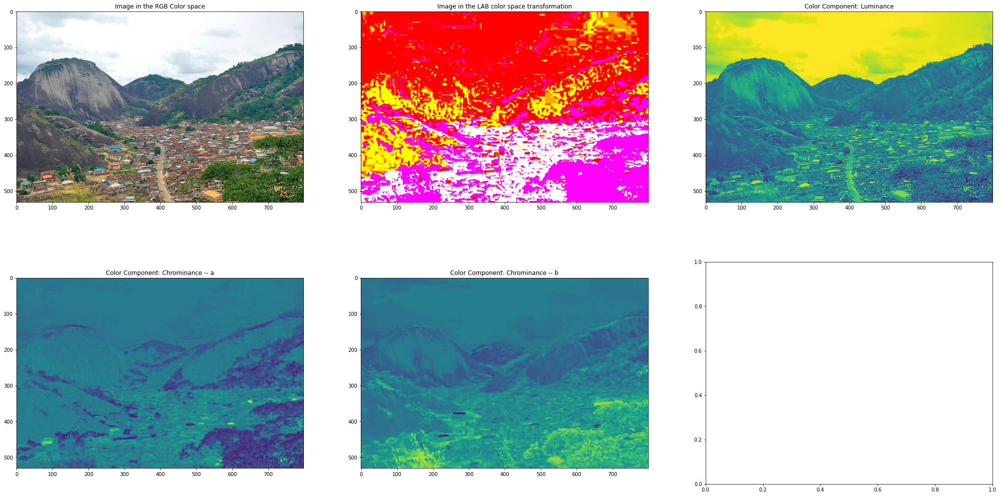

In [ ]:
# transform image to Lab colour space and display it's color components. 
img_lab = rgb2lab(img)
fig, axs = plt.subplots(2, 3, figsize=(35, 18))

axs[0, 0].imshow(img)
axs[0, 0].set_title("Image in the RGB Color space")

axs[0, 1].imshow(img_lab)
axs[0, 1].set_title("Image in the LAB color space transformation")

axs[0, 2].imshow(img_lab[:, :, 0])
axs[0, 2].set_title("Color Component: Luminance")

axs[1, 0].imshow(img_lab[:, :, 1])
axs[1, 0].set_title("Color Component: Chrominance -- a")

axs[1, 1].imshow(img_lab[:, :, 2])
axs[1, 1].set_title("Color Component: Chrominance -- b")

/usr/local/lib/python3.7/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 86994 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


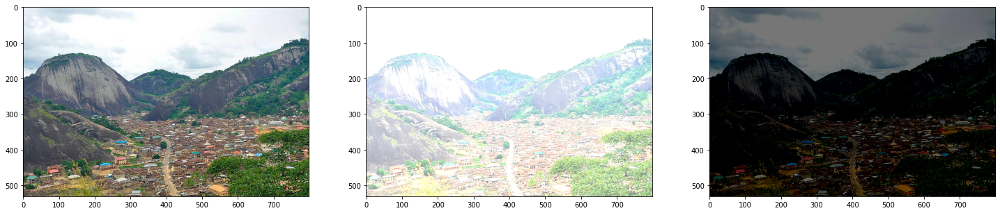

In [ ]:
# extract bright and dark component of the color space
fig, axs = plt.subplots(1, 3, figsize = (25, 10))
axs[0].imshow(img)

img_lab[...,0] = img_lab[...,0] + 50
bright_portion = lab2rgb(img_lab)

axs[1].imshow(bright_portion)


img_lab = rgb2lab(img)

img_lab[...,0] = img_lab[...,0] - 50
dark_portion = lab2rgb(img_lab)

axs[2].imshow(dark_portion)


###### HSV

Text(0.5, 1.0, 'Color Component: Value')

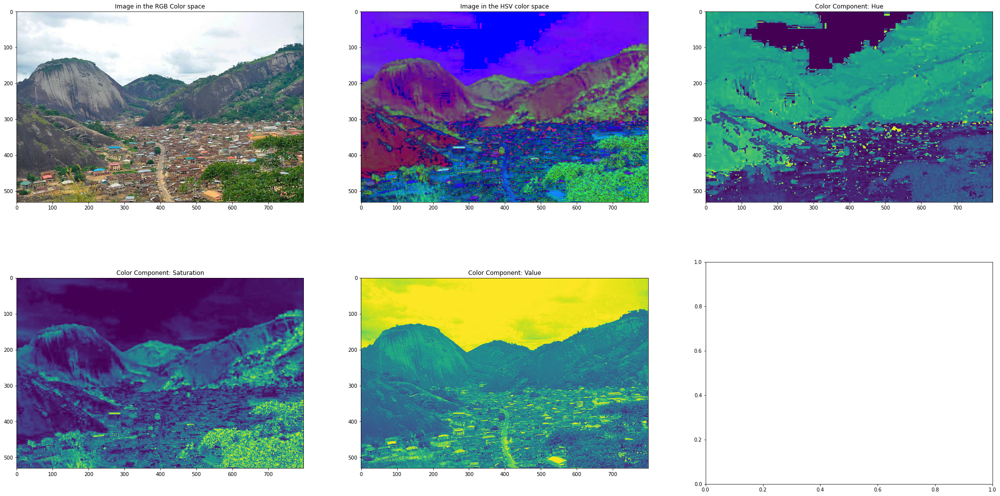

In [ ]:
# transform image to Lab colour space and display it's color components. 
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
fig, axs = plt.subplots(2, 3, figsize=(35, 18))

axs[0, 0].imshow(img)
axs[0, 0].set_title("Image in the RGB Color space")

axs[0, 1].imshow(img_hsv)
axs[0, 1].set_title("Image in the HSV color space")

axs[0, 2].imshow(img_hsv[:, :, 0])
axs[0, 2].set_title("Color Component: Hue")

axs[1, 0].imshow(img_hsv[:, :, 1])
axs[1, 0].set_title("Color Component: Saturation")

axs[1, 1].imshow(img_hsv[:, :, 2])
axs[1, 1].set_title("Color Component: Value")

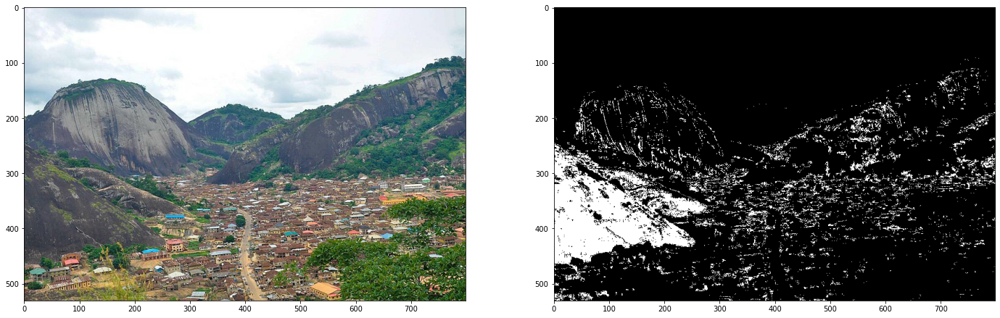

In [ ]:
lower_hue = np.array([0,0,0]) 
upper_hue = np.array([300,60,110])
mask      = cv2.inRange(img_hsv, lower_hue, upper_hue)
#extract   = cv2.bitwise_and(img,img, mask= mask)
fig, axs = plt.subplots(1, 2, figsize=(24, 12))


axs[0].imshow(img, cmap='gray')
axs[1].imshow(mask, cmap='gray')
#axs[2].imshow(extract)

#### **04 Color Composition -- Multitemporal image**

In [105]:
! pip install rasterio

     |████████████████████████████████| 19.3 MB 1.3 MB/s 


In [112]:
import rasterio
data = rasterio.open("/content/drive/MyDrive/UBS/Computer Vision/Data/lukole_Ikonos_pansharpened.tif")
print(data.meta)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 1598, 'height': 1572, 'count': 4, 'crs': CRS.from_epsg(32736), 'transform': Affine(1.0, 0.0, 262897.67253534496,
       0.0, -1.0, 9717875.818642491)}


In [115]:
# RG
Red = data.read(1)
Green = data.read(2)
Blue = data.read(3)
NIR = data.read(4)

Text(0.5, 1.0, 'NIR Band')

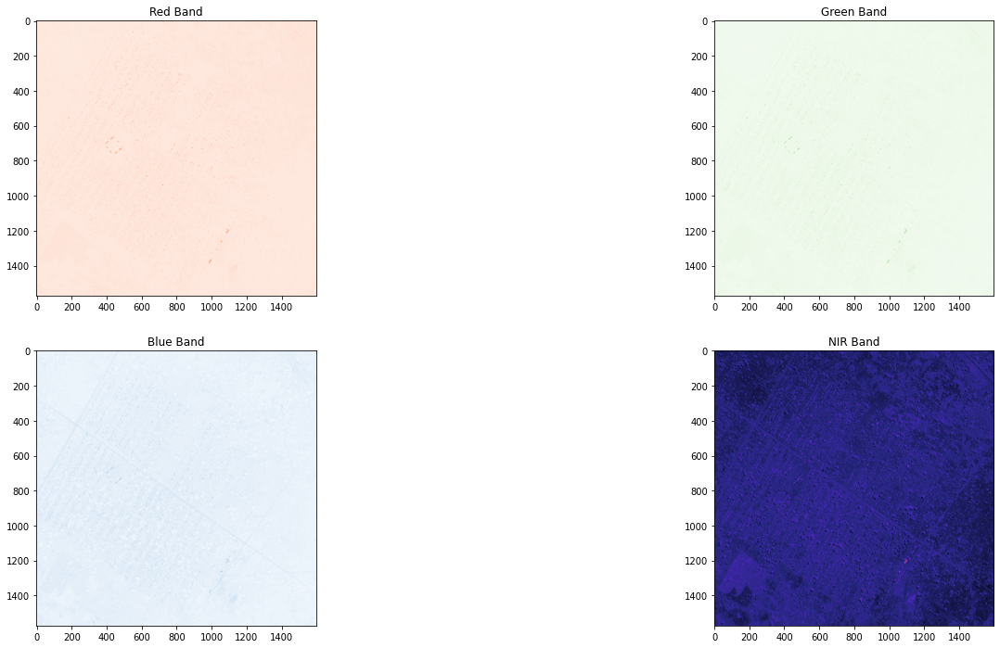

In [128]:
# display individual image bands
fig, axs = plt.subplots(2, 2, figsize = (24, 12))

axs[0, 0].imshow(Red, cmap = "Reds")
axs[0, 0].set_title("Red Band")

axs[0, 1].imshow(Green, cmap = "Greens")
axs[0, 1].set_title("Green Band")

axs[1, 0].imshow(Blue, cmap = "Blues")
axs[1, 0].set_title("Blue Band")

axs[1, 1].imshow(NIR, cmap = "CMRmap")
axs[1, 1].set_title("NIR Band")

In [140]:
RGB.shape

(1572, 1598, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


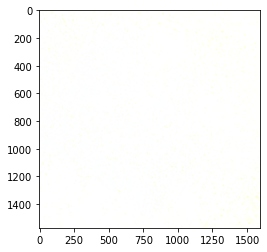

In [147]:
#true color composite
RGB = np.dstack(([Red, Green, Blue]))
plt.imshow(RGB)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


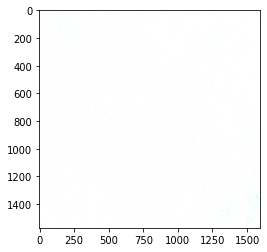

In [146]:
#false color composite
fcc = np.dstack((NIR, Red, Green))
plt.imshow(fcc, cmap='gray')

In [143]:
fcc.shape

(1572, 1598, 3)